##  Linear Regression 

- Dataset: bike sharing dataset- 서울시 공용자전거(2017-2018)
- FLOW

In [1]:
import sklearn
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.linear_model
import missingno as msno
%matplotlib inline

In [2]:
# data 불러오기불러오기
bike = pd.read_csv("datas/SeoulBikeData.csv", encoding='cp949')
bike

,Date,Rented Bike Count,Hour,Temperature(캜),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(캜),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes


<AxesSubplot:>

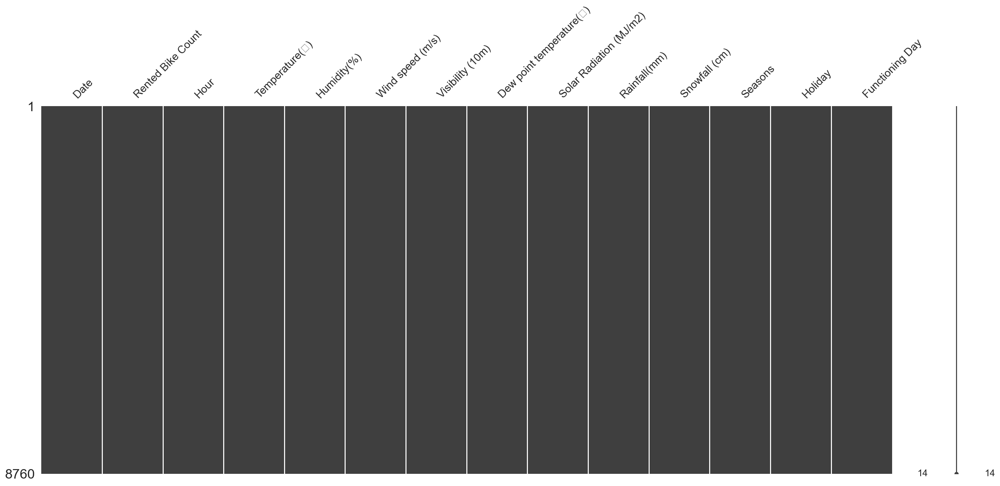

In [3]:
#결측치 확인
msno.matrix(bike)

In [4]:
# 컬럼명 변경 컬럼명 변경
bike.rename(columns={"Temperature(캜)": "Temperature(℃)", "Dew point temperature(캜)": "Dew point Temperature(℃)"}, inplace=True)

### 1. 데이터 살펴보기 (전처리 : 피처설정/ 피처정규화)

In [5]:
bike.shape

(8760, 14)

In [6]:
bike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      8760 non-null   object 
 1   Rented Bike Count         8760 non-null   int64  
 2   Hour                      8760 non-null   int64  
 3   Temperature(℃)            8760 non-null   float64
 4   Humidity(%)               8760 non-null   int64  
 5   Wind speed (m/s)          8760 non-null   float64
 6   Visibility (10m)          8760 non-null   int64  
 7   Dew point Temperature(℃)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)   8760 non-null   float64
 9   Rainfall(mm)              8760 non-null   float64
 10  Snowfall (cm)             8760 non-null   float64
 11  Seasons                   8760 non-null   object 
 12  Holiday                   8760 non-null   object 
 13  Functioning Day           8760 non-null   object 
dtypes: float

In [7]:
# 형변환 ()
#bike = bike.apply(pd.to_numeric, errors='coerce')
#bike['Date']=bike['Date'].astype('float')
#bike['Seasons']=bike['Seasons'].astype('float')
#bike['Holiday']=bike['Holiday'].astype('float')

In [8]:
bike.describe()

,Rented Bike Count,Hour,Temperature(℃),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point Temperature(℃),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


In [95]:
bike

,Rented Bike Count,Hour,Temperature(℃),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point Temperature(℃),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday_Holiday,Holiday_No Holiday
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,1
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,1
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,1
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,1
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,0,1
8756,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,0,1
8757,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,0,1
8758,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,0,1


#### 자전거 대여 횟수 분포

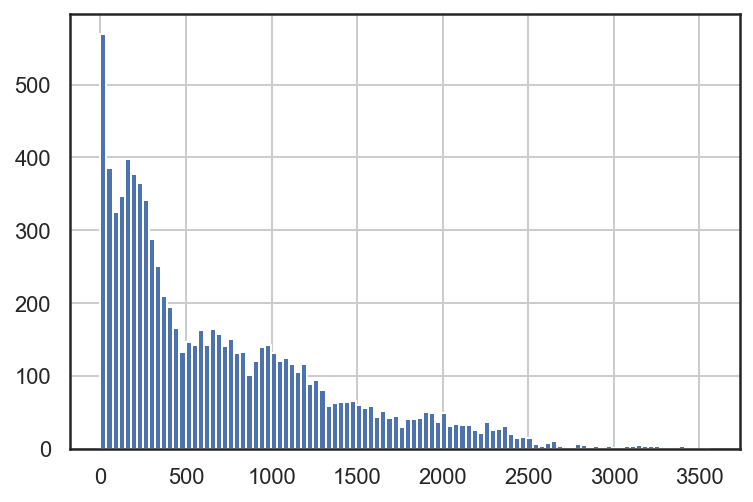

In [10]:
bike["Rented Bike Count"].hist(bins=100);

#### 자전거 대여 횟수 상자그림

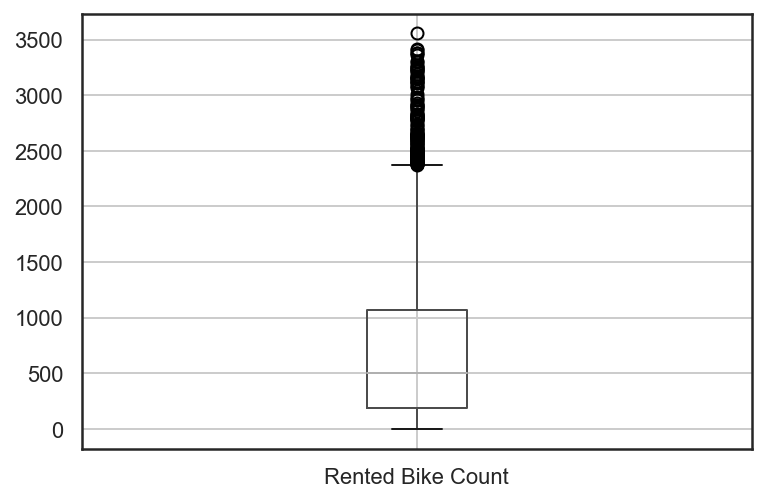

In [11]:
bike.boxplot(column=["Rented Bike Count"]);

### 1-1. 전처리 : 피처설정/ 피처정규화

##### 피처 정규화 -> visibility

In [12]:
bike.drop(['Date','Functioning Day','Seasons'], axis=1, inplace=True)
#['Date','Hour']
# bike["Seasons"]  Drop 이유 : 계절보다 일별, 시간대 데이터의 영향을 우선/다중공선성 우려
bike

,Rented Bike Count,Hour,Temperature(℃),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point Temperature(℃),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,No Holiday
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,No Holiday
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,No Holiday
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,No Holiday
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,No Holiday
...,...,...,...,...,...,...,...,...,...,...,...
8755,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,No Holiday
8756,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,No Holiday
8757,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,No Holiday
8758,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,No Holiday


#### 피처 살펴보기 (피처설정)

In [13]:
# 피쳐 히스토그램으로 그려서 비교하기 (features 빠지는 거 확인)
features = bike[['Rented Bike Count', 'Hour', 'Temperature(℃)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point Temperature(℃)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Holiday']]

In [14]:
# 각각의 피처에 대한 히스토그램 출력
def plot_hist_eadch_column(bike):
    plt.rcParams['figure.figsize'] = [11,16]
    fig = plt.figure()
    
# bike의 열 개수만큼의 subplot을 출력
for i in range(len(bike.columns)):
    ax = fig.add_subplot(5,5, i+1)
    ax.set_title(bike.columns[i])
plt.show()

plot_hist_each_column(features)

NameError: name 'fig' is not defined

In [15]:
bike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Rented Bike Count         8760 non-null   int64  
 1   Hour                      8760 non-null   int64  
 2   Temperature(℃)            8760 non-null   float64
 3   Humidity(%)               8760 non-null   int64  
 4   Wind speed (m/s)          8760 non-null   float64
 5   Visibility (10m)          8760 non-null   int64  
 6   Dew point Temperature(℃)  8760 non-null   float64
 7   Solar Radiation (MJ/m2)   8760 non-null   float64
 8   Rainfall(mm)              8760 non-null   float64
 9   Snowfall (cm)             8760 non-null   float64
 10  Holiday                   8760 non-null   object 
dtypes: float64(6), int64(4), object(1)
memory usage: 752.9+ KB


### 2. 예측하기

- 테스트 데이터셋 분리
- 선형회귀 모델 만들기
- 회귀 분서계수 학습(회귀 모델 학습)
- 어떤 피처가 영향력이 있을까

#### 예측변수 원핫인코딩 
- 'Holiday' etc 

In [26]:
bike= pd.get_dummies(bike, ['Holiday'])

### ㅇㅇ

In [17]:
import plotly.express as px

fig = px.histogram(bike, x ="Rented Bike Count", y="Temperature(℃)")
fig.show()

In [18]:
bike["Rented Bike Count"].describe()

count    8760.000000
mean      704.602055
std       644.997468
min         0.000000
25%       191.000000
50%       504.500000
75%      1065.250000
max      3556.000000
Name: Rented Bike Count, dtype: float64

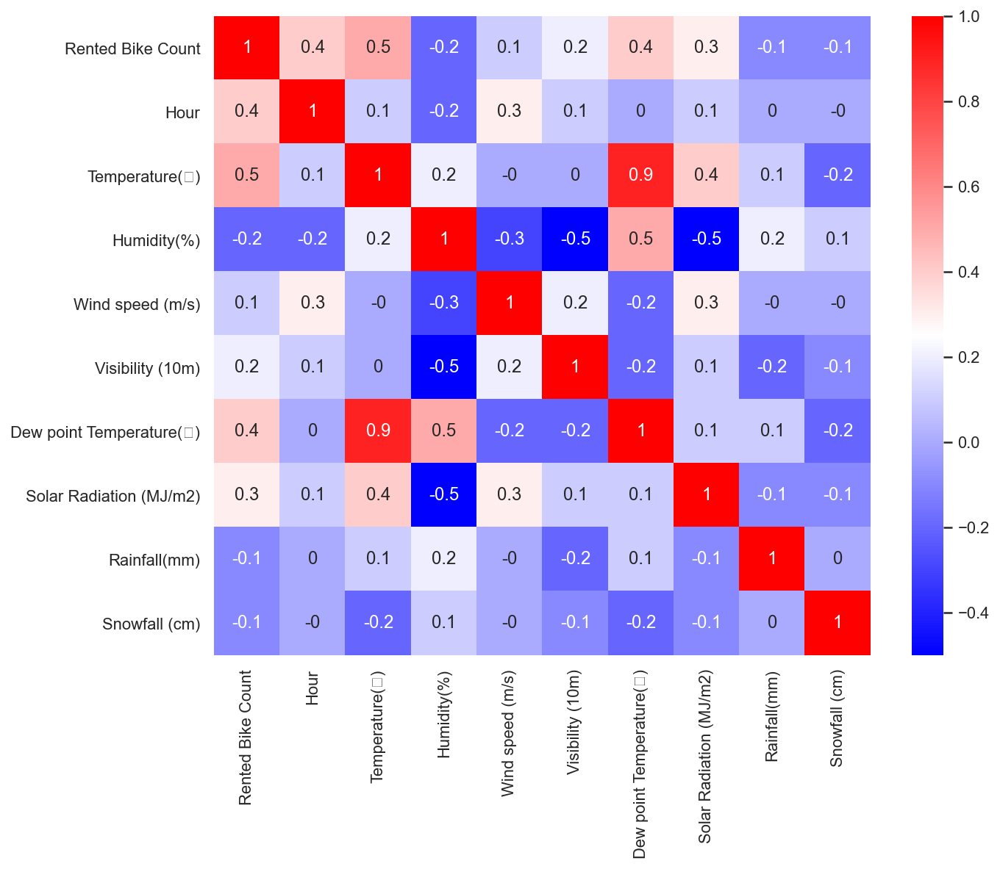

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

corr_mat = bike.corr().round(1)
sns.set(rc={'figure.figsize' :(10,8)})
sns.heatmap(data=corr_mat, annot=True, cmap='bwr');

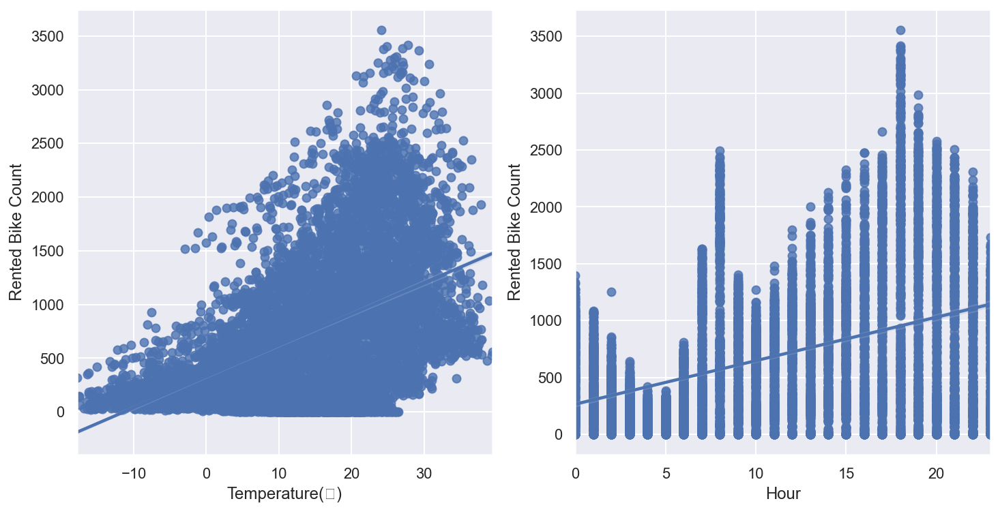

In [23]:
sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(12,6)})
fig, ax = plt.subplots(ncols=2)
sns.regplot(x='Temperature(℃)', y='Rented Bike Count', data=bike, ax=ax[0])
sns.regplot(x='Hour', y='Rented Bike Count', data=bike, ax=ax[1]);

#### 회귀분석을 위한 학습, 테스트 데이터셋 분리

In [28]:
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt

x = bike.drop('Rented Bike Count', axis=1)
y = bike['Rented Bike Count']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2,
                                                           random_state=13)
np.unique(y_train, return_counts=True)

(array([   0,    2,    3, ..., 3404, 3418, 3556], dtype=int64),
 array([247,   1,   1, ...,   1,   1,   1], dtype=int64))

#### 선형회귀 모델 만들기

In [29]:
import statsmodels.api as sm

lm = sm.OLS(y_train, x_train).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      Rented Bike Count   R-squared:                       0.470
Model:                            OLS   Adj. R-squared:                  0.469
Method:                 Least Squares   F-statistic:                     620.8
Date:                Wed, 24 Mar 2021   Prob (F-statistic):               0.00
Time:                        09:56:51   Log-Likelihood:                -53028.
No. Observations:                7008   AIC:                         1.061e+05
Df Residuals:                    6997   BIC:                         1.062e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Hour                        26.9170      0.881     30.541      0.000      25.189      28.645
Temperature(℃)              23.3436      4.371      5.341      0.000      14.775      31.912
Humidity(%)                 -9.8609      1.246     -7.911      0.000     -12.304      -7.417
Wind speed (m/s)             7.9559      6.074      1.310      0.190      -3.950      19.862
Visibility (10m)             0.0214      0.011      1.863      0.062      -0.001       0.044
Dew point Temperature(℃)     8.8182      4.612      1.912      0.056      -0.222      17.858
Solar Radiation (MJ/m2)    -80.2479      9.176     -8.746      0.000     -98.235     -62.260
Rainfall(mm)               -53.8340      4.947    -10.881      0.000     -63.532     -44.136
Snowfall (cm)               23.0704     13.424      1.719      0.086      -3.245      49.385
Holiday_Holiday            468.3478    114.430      4.093      0.000     244.031     692.665
Holiday_No Holiday         645.2121    112.127      5.754      0.000     425.409     865.016
==============================================================================
Omnibus:                      810.266   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1597.865
Skew:                           0.741   Prob(JB):                         0.00
Kurtosis:                       4.809   Cond. No.                     4.45e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.45e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### 개념확인
    - F-statistic(F통계량)수치 확인
        - 회귀식의 유의성 검정에 사용하는 값으로, F통계량에 대한 p-value인 Prob(F-statistic) 수치와 함께 봐야함.
        - 일반적으로 p-value가 0.05 이하면 'F통계량이 유의한 의미를 가진다'라는 결론을 내려도 무방하며
          이는 회귀분석이 유의미한 결과를 가진다는 것을 의미
    - P>|t| 라는 정보는 각 피처의 검정 통계량(t-statistic)이 얼마나 유의미한지 p-value를 나타내는 것

In [30]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      Rented Bike Count   R-squared:                       0.470
Model:                            OLS   Adj. R-squared:                  0.469
Method:                 Least Squares   F-statistic:                     620.8
Date:                Wed, 24 Mar 2021   Prob (F-statistic):               0.00
Time:                        09:56:54   Log-Likelihood:                -53028.
No. Observations:                7008   AIC:                         1.061e+05
Df Residuals:                    6997   BIC:                         1.062e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Hour                        26.9170      0.881     30.541      0.000      25.189      28.645
Temperature(℃)              23.3436      4.371      5.341      0.000      14.775      31.912
Humidity(%)                 -9.8609      1.246     -7.911      0.000     -12.304      -7.417
Wind speed (m/s)             7.9559      6.074      1.310      0.190      -3.950      19.862
Visibility (10m)             0.0214      0.011      1.863      0.062      -0.001       0.044
Dew point Temperature(℃)     8.8182      4.612      1.912      0.056      -0.222      17.858
Solar Radiation (MJ/m2)    -80.2479      9.176     -8.746      0.000     -98.235     -62.260
Rainfall(mm)               -53.8340      4.947    -10.881      0.000     -63.532     -44.136
Snowfall (cm)               23.0704     13.424      1.719      0.086      -3.245      49.385
Holiday_Holiday            468.3478    114.430      4.093      0.000     244.031     692.665
Holiday_No Holiday         645.2121    112.127      5.754      0.000     425.409     865.016
==============================================================================
Omnibus:                      810.266   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1597.865
Skew:                           0.741   Prob(JB):                         0.00
Kurtosis:                       4.809   Cond. No.                     4.45e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.45e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### 회귀 분석 계수 학습& 학습된 계수 출력


In [36]:
reg =linear_model.LinearRegression()
model =reg.fit(x_train, y_train)

# 학습된 계수출력
print(reg.coef_)

[ 2.69169657e+01  2.33435532e+01 -9.86092219e+00  7.95585965e+00
  2.14074107e-02  8.81817047e+00 -8.02478733e+01 -5.38340420e+01
  2.30703889e+01 -8.84321464e+01  8.84321464e+01]


#### 어떤 피쳐가 가장 영향력이 강한 피쳐일까

[Text(0, 0, 'Hour'),
 Text(1, 0, 'Temperature(℃)'),
 Text(2, 0, 'Humidity(%)'),
 Text(3, 0, 'Wind speed (m/s)'),
 Text(4, 0, 'Visibility (10m)'),
 Text(5, 0, 'Dew point Temperature(℃)'),
 Text(6, 0, 'Solar Radiation (MJ/m2)'),
 Text(7, 0, 'Rainfall(mm)'),
 Text(8, 0, 'Snowfall (cm)'),
 Text(9, 0, 'Holiday_Holiday'),
 Text(10, 0, 'Holiday_No Holiday')]

findfont: Font family ['NanumGothic0TF'] not found. Falling back to DejaVu Sans.
findfont: Font family ['NanumGothic0TF'] not found. Falling back to DejaVu Sans.


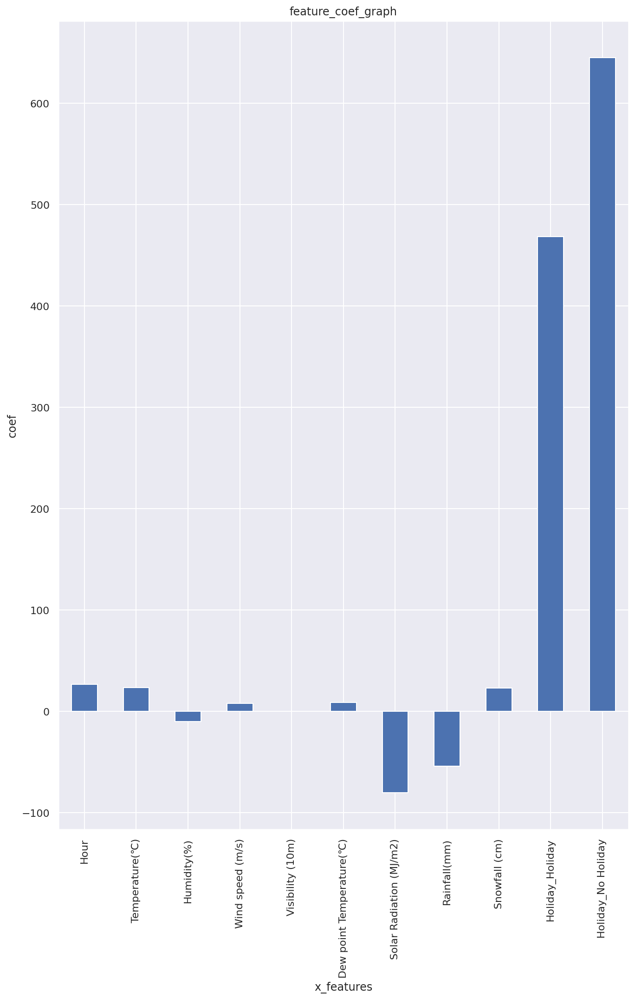

In [34]:
mpl.rc('font', family='NanumGothic0TF')
plt.rcParams['figure.figsize']= [11,16]

#회귀 계수를 리스트로 반환
coefs = lm.params.tolist()
coefs_series = pd.Series(coefs)

#변수명을 리스트로 반환
x_labels = lm.params.index.tolist()

#회귀계수 출력
ax = coefs_series.plot(kind='bar')
ax.set_title('feature_coef_graph')
ax.set_xlabel('x_features')
ax.set_ylabel('coef')
ax.set_xticklabels(x_labels)

#### 예측

In [37]:
predictions = lm.predict(x_test)
predictions

7043     589.015180
5999    1448.588807
2276     745.031809
961     -205.762199
7548     805.806003
           ...     
1005     298.357087
2714     310.882462
5039    1018.049616
4642     882.043183
4163     839.586168
Length: 1752, dtype: float64

In [38]:
y_test

7043     111
5999    1136
2276     578
961       78
7548     967
        ... 
1005     162
2714     305
5039     931
4642     971
4163    1012
Name: Rented Bike Count, Length: 1752, dtype: int64

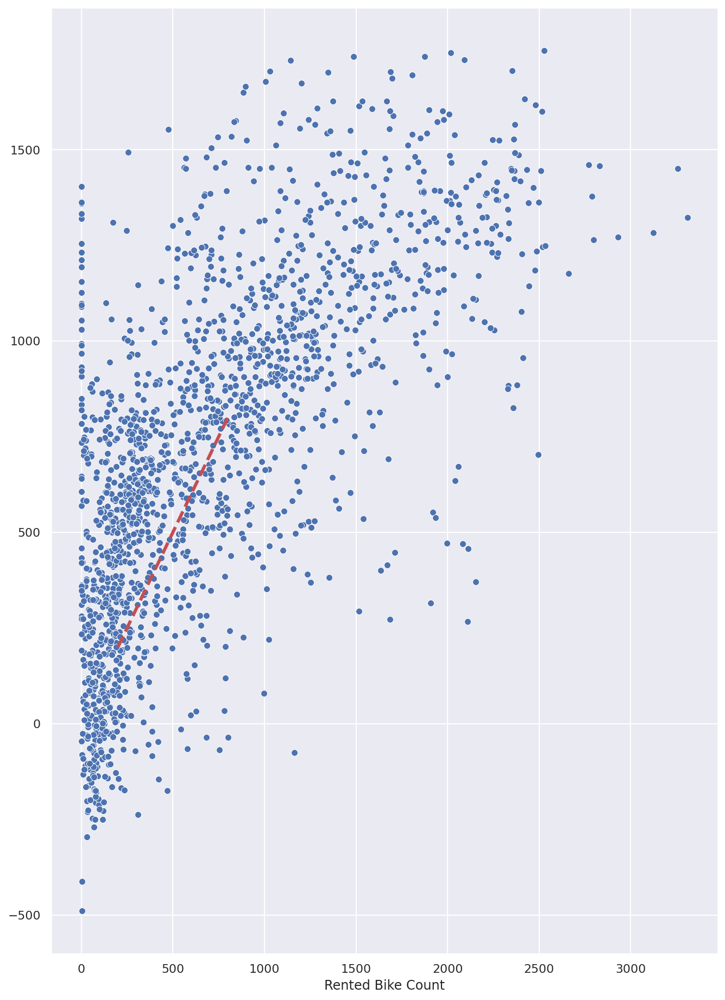

In [39]:
sns.scatterplot(y_test,predictions);
plt.plot([200,800], [200, 800], 'r', ls='dashed', lw=3);

### 3. 평가

#### Linear Regression

In [41]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(x_train, y_train)

LinearRegression()

In [42]:
import numpy as np
from sklearn.metrics import mean_squared_error

pred_tr = reg.predict(x_train)
pred_test = reg.predict(x_test)
rmse_tr = (np.sqrt(mean_squared_error(y_train, pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test, pred_test)))

print('RMSE of Train Data: ', rmse_tr)
print('RMSE of Test Data: ', rmse_test)

RMSE of Train Data:  467.73860077300935
RMSE of Test Data:  469.2872912496238


#### 예측 모델 평가하기

In [60]:
#reg = LinearRegression()
#reg.fit(x_train, y_train)

print(reg.score(x_train, y_train))
print(reg.score(x_test, y_test))

0.4701079097958948
0.4855223481234917


### Boxplot 으로 비교

In [54]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Box(y=x['Temperature(℃)'], name='Temperature'))
fig.add_trace(go.Box(y=x['Humidity(%)'], name='Humidity'))
fig.add_trace(go.Box(y=x['Wind speed (m/s)'], name='Wind speed'))
fig.add_trace(go.Box(y=x['Visibility (10m)'], name='Visibility'))
fig.add_trace(go.Box(y=x['Dew point Temperature(℃)'], name='Dew point Temperature'))
fig.add_trace(go.Box(y=x['Rainfall(mm)'], name='Rainfall'))
fig.add_trace(go.Box(y=x['Snowfall (cm)'], name='Snowfall'))

fig.add_trace(go.Box(y=x['Holiday_Holiday'], name='Holiday'))
fig.add_trace(go.Box(y=x['Holiday_No Holiday'], name='No Holiday'))


fig.show()

### MinMaxScaler 와 StandardScaler

In [47]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

MMS = MinMaxScaler()
SS = StandardScaler()

SS.fit(x)
MMS.fit(x)

x_ss = SS.transform(x)
x_mms = MMS.transform(x)

In [48]:
x_ss_pd = pd.DataFrame(x_ss, columns=x.columns)
x_mms_pd = pd.DataFrame(x_mms, columns=x.columns)

#### MinMaxScaler

In [56]:
fig = go.Figure()
fig.add_trace(go.Box(y=x_mms_pd['Temperature(℃)'], name='Temperature'))
fig.add_trace(go.Box(y=x_mms_pd['Humidity(%)'], name='Humidity'))
fig.add_trace(go.Box(y=x_mms_pd['Wind speed (m/s)'], name='Wind speed'))
fig.add_trace(go.Box(y=x_mms_pd['Visibility (10m)'], name='Visibility'))
fig.add_trace(go.Box(y=x_mms_pd['Dew point Temperature(℃)'], name='Dew point Temperature'))
fig.add_trace(go.Box(y=x_mms_pd['Rainfall(mm)'], name='Rainfall'))
fig.add_trace(go.Box(y=x_mms_pd['Snowfall (cm)'], name='Snowfall'))
fig.add_trace(go.Box(y=x_mms_pd['Holiday_Holiday'], name='Holiday'))
fig.add_trace(go.Box(y=x_mms_pd['Holiday_No Holiday'], name='No Holiday'))

fig.show()

#### StandardScaler

In [57]:
fig = go.Figure()
fig.add_trace(go.Box(y=x_ss_pd['Temperature(℃)'], name='Temperature'))
fig.add_trace(go.Box(y=x_ss_pd['Humidity(%)'], name='Humidity'))
fig.add_trace(go.Box(y=x_ss_pd['Wind speed (m/s)'], name='Wind speed'))
fig.add_trace(go.Box(y=x_ss_pd['Visibility (10m)'], name='Visibility'))
fig.add_trace(go.Box(y=x_ss_pd['Dew point Temperature(℃)'], name='Dew point Temperature'))
fig.add_trace(go.Box(y=x_ss_pd['Rainfall(mm)'], name='Rainfall'))
fig.add_trace(go.Box(y=x_ss_pd['Snowfall (cm)'], name='Snowfall'))
fig.add_trace(go.Box(y=x_ss_pd['Holiday_Holiday'], name='Holiday'))
fig.add_trace(go.Box(y=x_ss_pd['Holiday_No Holiday'], name='No Holiday'))


fig.show()

#### 피처들간 상관관계

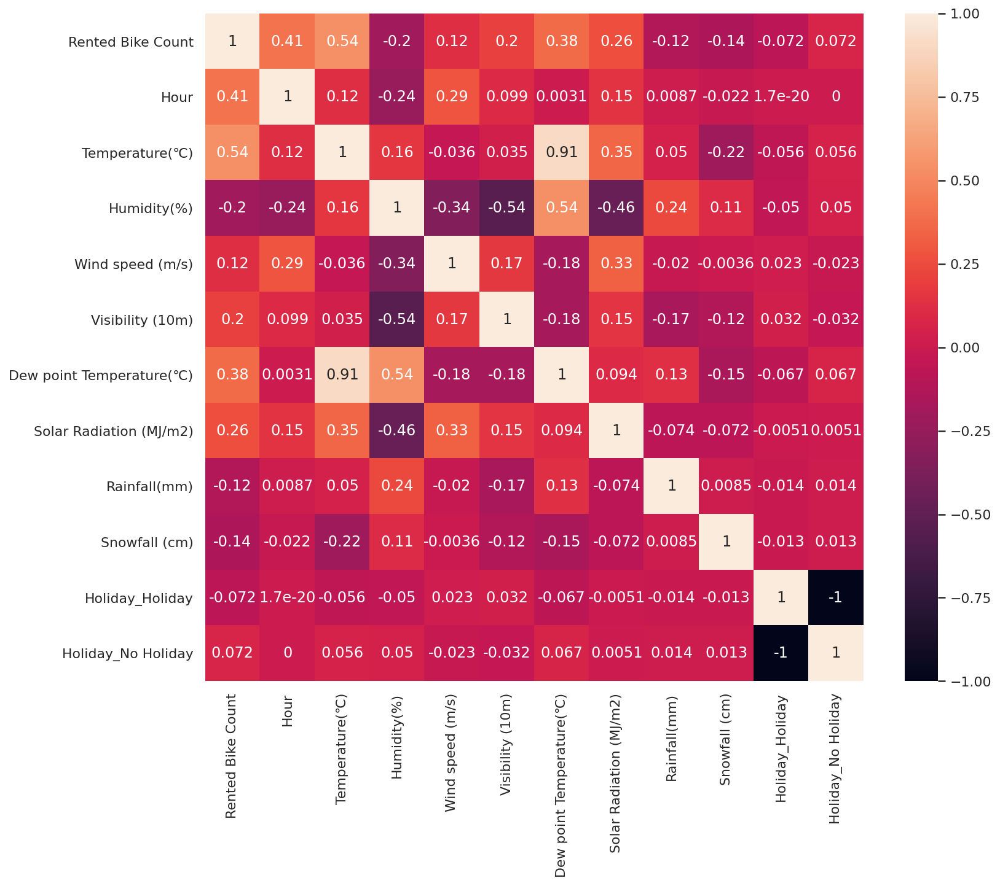

In [58]:
plt.figure(figsize = (12,10))
sns.heatmap(bike.corr(),annot=True);

#### 다중 공선성 확인: 회귀 분석 예측 성능을 높이기 위한 방법

In [61]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

#피처마다의 VIF 계수를 출력
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(x.values, i)  for i in range(x.shape[1])]
vif["features"] = x.columns
vif.round(1)

,VIF Factor,features
0,1.2,Hour
1,87.1,Temperature(℃)
2,20.4,Humidity(%)
3,1.3,Wind speed (m/s)
4,1.6,Visibility (10m)
5,115.7,Dew point Temperature(℃)
6,2.0,Solar Radiation (MJ/m2)
7,1.1,Rainfall(mm)
8,1.1,Snowfall (cm)
9,20.5,Holiday_Holiday


### 4. 시각화 (분석결과 시각화하기)
- 이 부분은 보류